In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import squidpy as sq
import matplotlib.pyplot as plt
import seaborn as sns

/home/shannon/miniconda3/lib/python3.12/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/home/shannon/miniconda3/lib/python3.12/site-packages/anndata/utils.py:429: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)


In [2]:
adata = sc.read_h5ad('1st_trimester_merged_Oct_24.h5ad')

In [3]:
adata

AnnData object with n_obs × n_vars = 4918 × 17943
    obs: 'in_tissue', 'array_row', 'array_col', 'Trimester', 'Sample', 'Gestation', 'Code', 'Batch', 'n_genes_by_counts', 'total_counts'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'Sample_colors', 'spatial'
    obsm: 'X_spatial_First_tri_1', 'X_spatial_First_tri_2', 'X_spatial_First_tri_3', 'X_spatial_Merged', 'spatial'

In [4]:
sc.pp.filter_cells(adata, min_genes=100)
sc.pp.filter_genes(adata, min_cells=3)

In [5]:
adata

AnnData object with n_obs × n_vars = 4917 × 14912
    obs: 'in_tissue', 'array_row', 'array_col', 'Trimester', 'Sample', 'Gestation', 'Code', 'Batch', 'n_genes_by_counts', 'total_counts', 'n_genes'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    uns: 'Sample_colors', 'spatial'
    obsm: 'X_spatial_First_tri_1', 'X_spatial_First_tri_2', 'X_spatial_First_tri_3', 'X_spatial_Merged', 'spatial'

In [6]:
sc.pp.highly_variable_genes(
    adata,
    n_top_genes=2500,
    subset=False,
    flavor="seurat_v3",
    batch_key="Sample",
)

In [7]:
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)

In [8]:
# run PCA then generate UMAP plots
sc.tl.pca(adata)

In [9]:
sc.external.pp.harmony_integrate(adata, key=['Batch', 'Gestation'],  basis='X_pca', adjusted_basis='X_pca_harmony') 

2025-05-28 12:17:08,274 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-05-28 12:17:09,302 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-05-28 12:17:09,351 - harmonypy - INFO - Iteration 1 of 10
2025-05-28 12:17:10,935 - harmonypy - INFO - Iteration 2 of 10
2025-05-28 12:17:12,478 - harmonypy - INFO - Iteration 3 of 10
2025-05-28 12:17:14,537 - harmonypy - INFO - Converged after 3 iterations


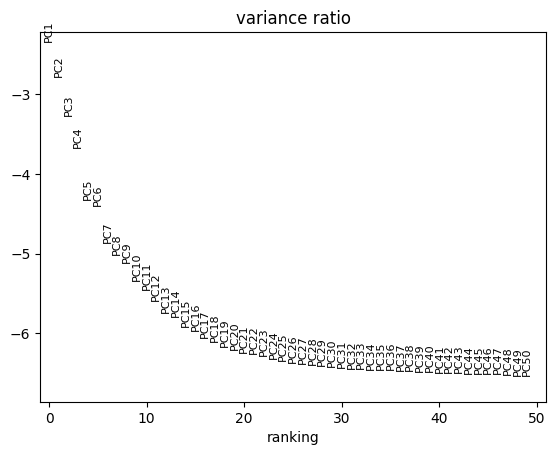

In [10]:
sc.pl.pca_variance_ratio(adata, n_pcs=50, log=True)

In [11]:
sc.pp.neighbors(adata, n_pcs=17, n_neighbors=20, use_rep="X_pca_harmony")
sc.tl.umap(adata)#, min_dist=0.3)

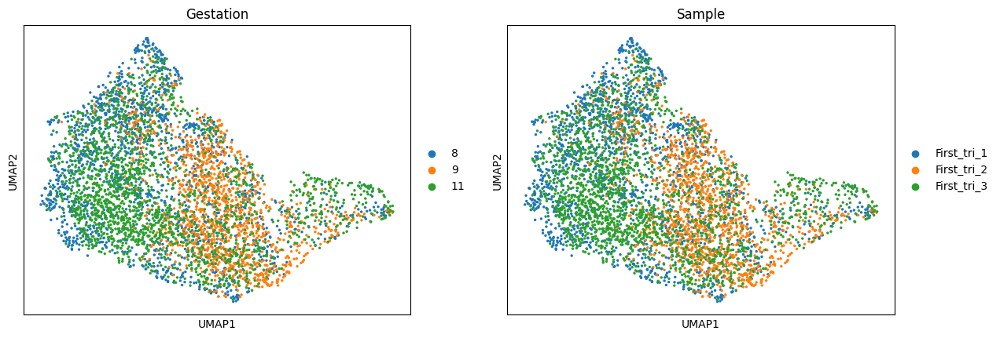

In [12]:
sc.pl.umap(adata, color=["Gestation", 'Sample'])

/tmp/ipykernel_1510/2637859321.py:1: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=1.5)


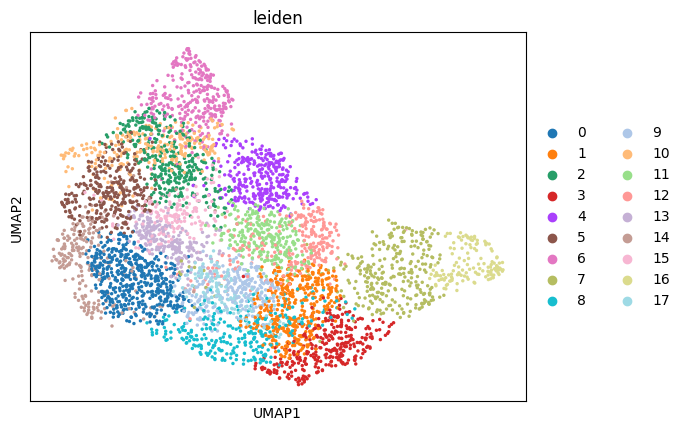

In [13]:
sc.tl.leiden(adata, resolution=1.5)
sc.pl.umap(adata, color=["leiden"])

In [29]:
df2 = pd.crosstab(adata.obs['Sample'], adata.obs['leiden'])
df2_norm = (df2-df2.min())/(df2.max()-df2.min())

<Axes: xlabel='leiden', ylabel='Sample'>

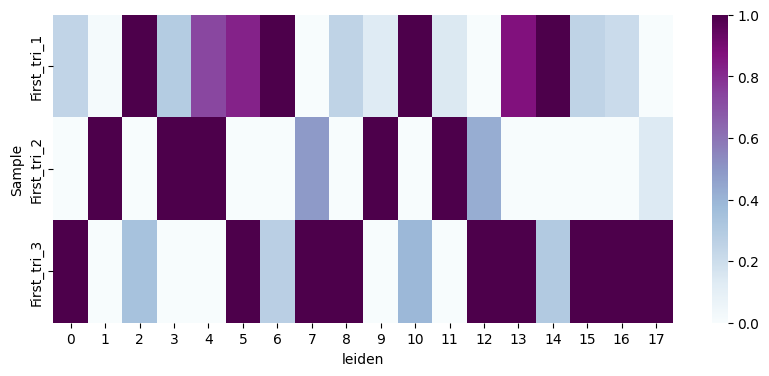

In [30]:
plt.rcParams["axes.grid"] = False
fig, ax = plt.subplots(figsize=(10,4))
sns.heatmap(df2_norm, cmap="BuPu", xticklabels=True)
#fig.savefig('Heatmap_25_clusters.png')

In [31]:
adata

AnnData object with n_obs × n_vars = 4917 × 14912
    obs: 'in_tissue', 'array_row', 'array_col', 'Trimester', 'Sample', 'Gestation', 'Code', 'Batch', 'n_genes_by_counts', 'total_counts', 'n_genes', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'Sample_colors', 'spatial', 'hvg', 'log1p', 'pca', 'neighbors', 'umap', 'Gestation_colors', 'leiden', 'leiden_colors'
    obsm: 'X_spatial_First_tri_1', 'X_spatial_First_tri_2', 'X_spatial_First_tri_3', 'X_spatial_Merged', 'spatial', 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

#### Identify DEGS per "Sample" ####

In [32]:
adata.uns['log1p']["base"] = None

In [33]:
sc.tl.rank_genes_groups(adata, 'Sample', method='wilcoxon', key_added = "wilcoxon_clusters")

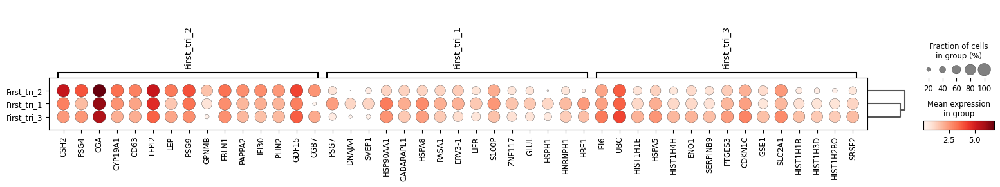

In [34]:
sc.pl.rank_genes_groups_dotplot(adata, n_genes=15, key="wilcoxon_clusters", groupby="Sample")

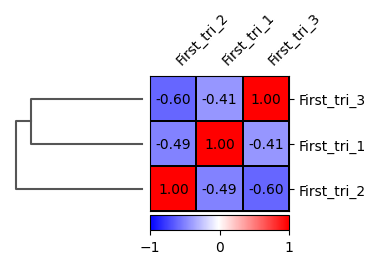

In [35]:
sc.pl.correlation_matrix(adata, groupby="Sample", show_correlation_numbers=True)

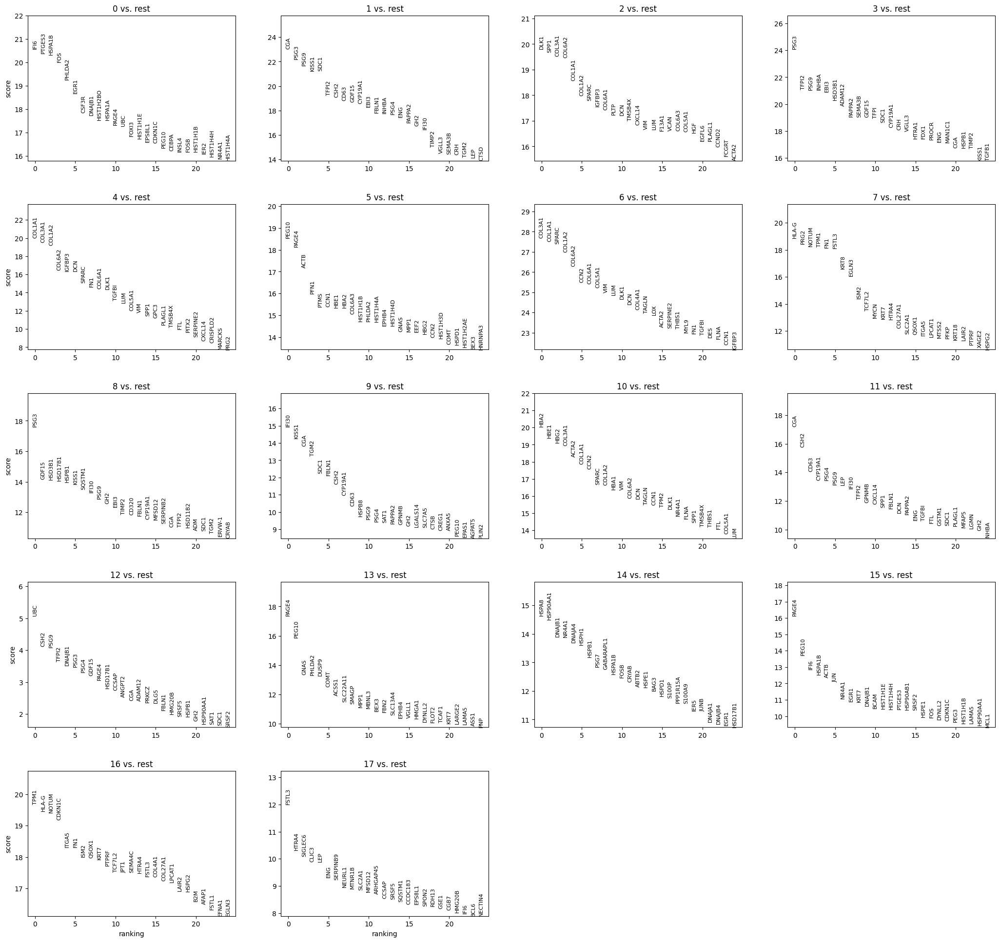

In [36]:
#to determine cells in each cluster
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon', key_added = "wilcoxon_leiden",)
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key = "wilcoxon_leiden")

In [38]:
result = adata.uns['wilcoxon_leiden']
groups = result['names'].dtype.names
adata_genes= pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals','logfoldchanges']})

adata_genes.head()

,0_n,0_p,0_l,1_n,1_p,1_l,2_n,2_p,2_l,3_n,...,14_l,15_n,15_p,15_l,16_n,16_p,16_l,17_n,17_p,17_l
0,IFI6,4.684687e-94,0.913171,CGA,2.139793e-117,1.106148,DLK1,2.566701e-87,1.530565,PSG3,...,1.166717,PAGE4,1.017849e-58,1.264838,TPM1,3.167962e-86,3.527247,FSTL3,3.259726e-33,1.725865
1,PTGES3,2.557547e-92,0.950918,PSG3,3.053310e-109,0.948023,SPP1,2.993876e-86,2.169717,TFPI2,...,1.312540,PEG10,6.609024e-43,1.022087,HLA-G,1.990684e-84,5.876936,HTRA4,5.658634e-25,1.410616
2,HSPA1B,9.145875e-92,1.632735,PSG9,3.155099e-104,1.205760,COL3A1,8.015482e-85,1.440358,PSG9,...,1.389781,IFI6,6.003429e-38,1.047142,NOTUM,6.259704e-84,5.633842,SIGLEC6,5.836786e-24,1.166859
3,FOS,4.838149e-89,1.232933,KISS1,2.765014e-100,0.861587,COL6A2,2.437021e-84,1.507915,INHBA,...,1.565243,HSPA1B,4.120559e-36,1.544616,CDKN1C,5.674014e-82,2.145390,CLIC3,4.316673e-23,0.787455
4,PHLDA2,9.478615e-83,0.946777,SDC1,5.298172e-100,1.104188,COL1A1,5.193563e-77,1.496072,EBI3,...,2.359988,ACTB,4.405903e-35,0.846837,ITGA5,5.659028e-75,2.963661,LEP,4.333887e-23,1.207148


In [40]:
adata_genes.to_csv('spatial1_markergenes_clusters.csv')

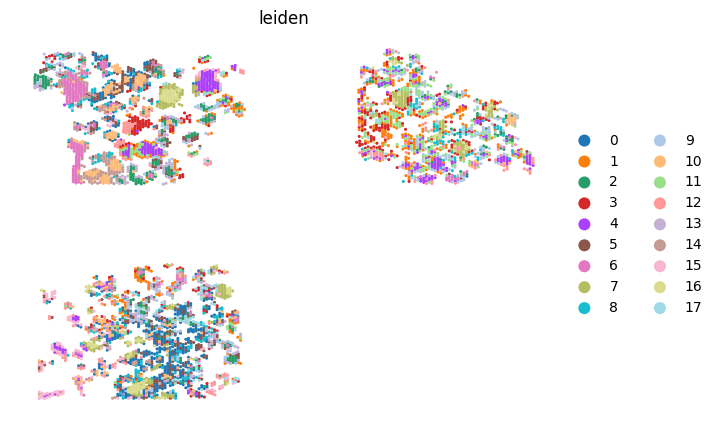

In [39]:
sc.pl.scatter(adata, basis="spatial_Merged", color="leiden", size=20, frameon=False) #, save="first_tri_spatial_clusters.png") #groups=["32"],

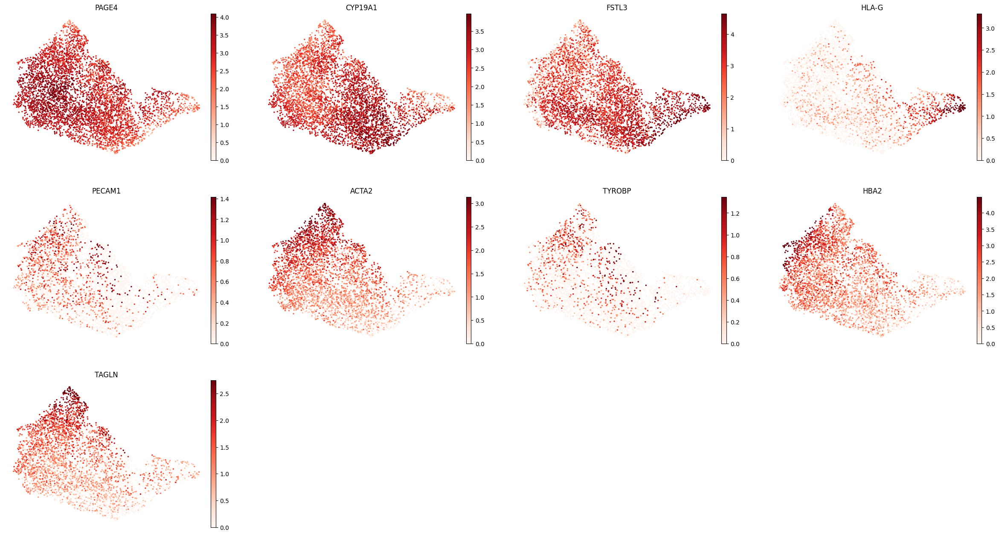

In [43]:
sc.pl.umap(   
    adata,
    color=["PAGE4", # "PEG10" CTB
           "CYP19A1", # STB CELLMARKER2.0
           "FSTL3", # EVT HUMAN PROTEIN ATLAS "HLA-G"
           "HLA-G",
           "PECAM1", # END https://www.frontiersin.org/journals/cardiovascular-medicine/articles/10.3389/fcvm.2019.00165/full
           "ACTA2", # SM PANGLAODB
           "TYROBP", # HB HUMAN PROTEIN ATLAS
           "HBA2", # MIC 
           "TAGLN"], # FB meg 1st_trimester
    vmax="p99",
    legend_loc="on data",
    frameon=False,
    cmap="Reds",
)

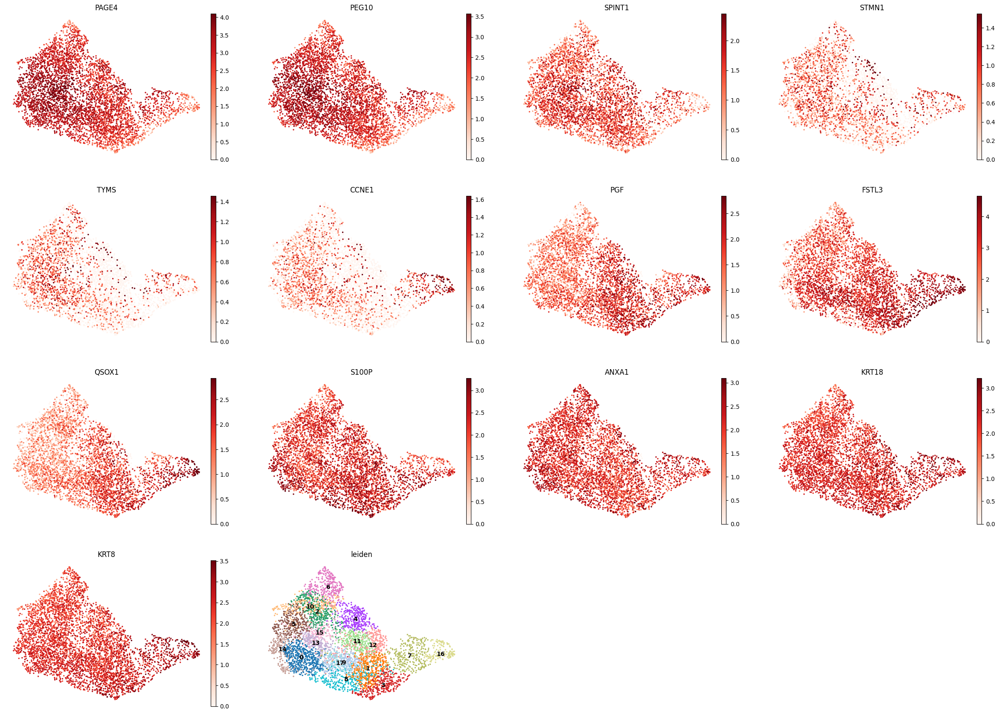

In [61]:
sc.pl.umap(   
    adata,
    color=["PAGE4", # vt CTB
           "PEG10",
           "SPINT1",
           "STMN1",
           "TYMS",
           "CCNE1", # vt EVT
           "PGF",
           "FSTL3",
           "QSOX1",
           "S100P", # vt STB
           "ANXA1",
           "KRT18",
           "KRT8",
           "leiden"
          ], 
    vmax="p99",
    legend_loc="on data",
    frameon=False,
    cmap="Reds",
)

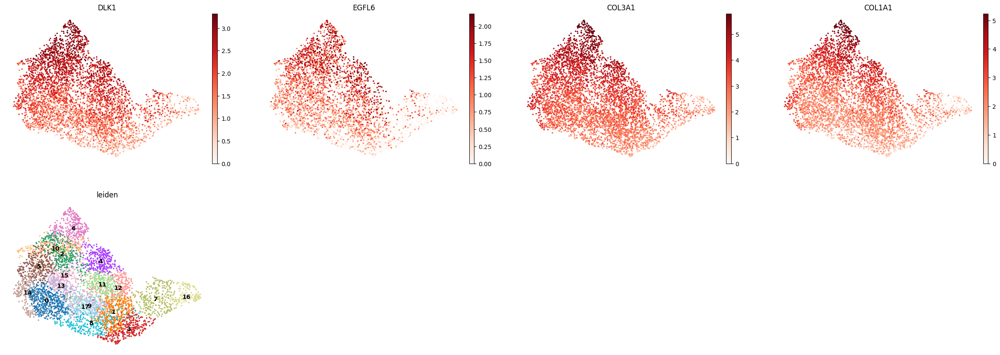

In [62]:
sc.pl.umap(   
    adata,
    color=["DLK1", # vt STROMAL
           "EGFL6",
           "COL3A1",
           "COL1A1",
           "leiden"
          ], 
    vmax="p99",
    legend_loc="on data",
    frameon=False,
    cmap="Reds",
)

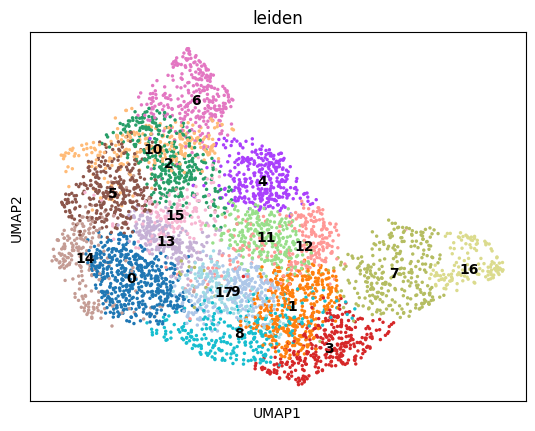

In [14]:
sc.pl.umap(adata, color=["leiden"], legend_loc="on data")

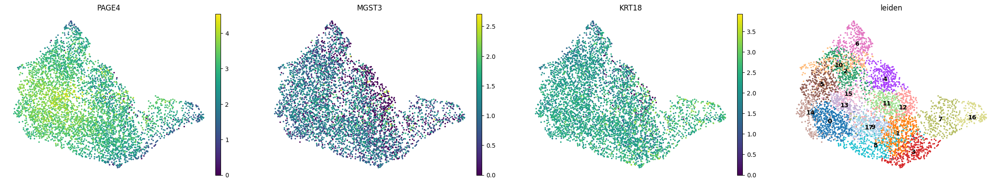

In [71]:
## npiCTB cell markers
sc.pl.umap(
    adata,
    color=["PAGE4","MGST3","KRT18","leiden"],legend_loc="on data",
    frameon=False,
)

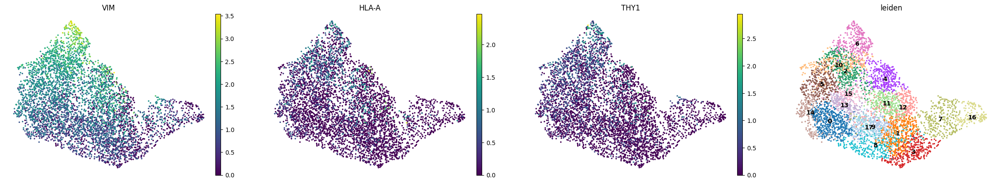

In [73]:
## general stromal cell markers
sc.pl.umap(
    adata,
    color=["VIM","HLA-A","THY1","leiden"],legend_loc="on data",
    frameon=False,
)

In [15]:
# create a dictionary to map cluster to annotation label
celltype = {
     '0': 'Mixed',
     '1': 'Trophoblast', 
     '2': 'Stromal', 
     '3': 'Trophoblast', 
     '4': 'Stromal', 
     '5': 'Mixed', 
     '6': 'Stromal', 
     '7': 'Trophoblast', 
     '8': 'Mixed', 
     '9': 'Trophoblast', 
     '10': 'Stromal', 
     '11': 'Trophoblast', 
     '12': 'Trophoblast', 
     '13': 'Mixed', 
     '14': 'Mixed', 
     '15': 'Mixed', 
     '16': 'Trophoblast', 
     '17': 'Mixed'
}

# add a new `.obs` column called `cell_type` by mapping clusters to annotation using pandas `map` function
adata.obs['cell_type'] = adata.obs['leiden'].map(celltype).astype('category')

In [16]:
# create a dictionary to map cluster to annotation label
uniquecelltype = {
     '0': 'Mixed1', #y
     '1': 'Trophoblast1', # TB vt
     '2': 'Stromal1', # F1 vt
     '3': 'Trophoblast2', # TB vt
     '4': 'Stromal2', # F1 vt
     '5': 'Mixed2', # Y
     '6': 'Stromal3', # F1 vt
     '7': 'Trophoblast3', # TB vt
     '8': 'Mixed3', # y
     '9': 'Trophoblast4', # # TB vt
     '10': 'Stromal4', # F1 vt
     '11': 'Trophoblast5', # CELLMARKER
     '12': 'Trophoblast6', # # TB vt
     '13': 'Mixed4', # TB vt PAGE4/PEG10
     '14': 'Mixed5', #Y
     '15': 'Mixed6', # TB vt PAGE4/PEG10
     '16': 'Trophoblast7', # TB vt
     '17': 'Mixed7'
}

# add a new `.obs` column called `unique_cell_type` by mapping clusters to annotation using pandas `map` function
adata.obs['unique_cell_type'] = adata.obs['leiden'].map(uniquecelltype).astype('category')

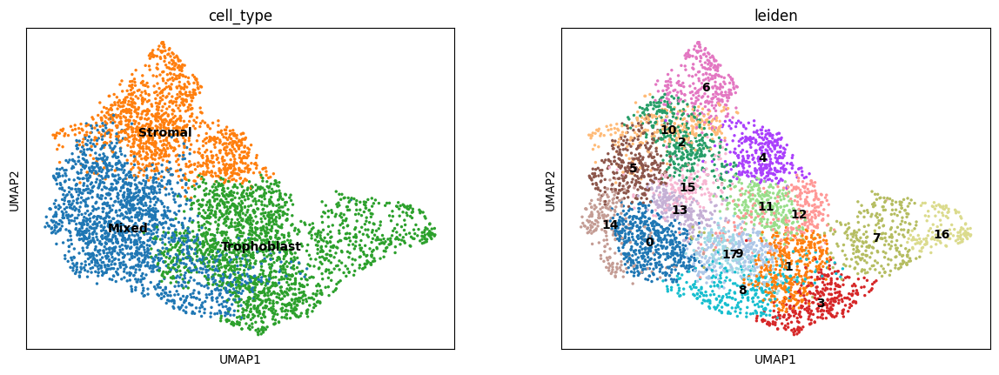

In [17]:
sc.pl.umap(adata, color=["cell_type","leiden"], legend_loc="on data")

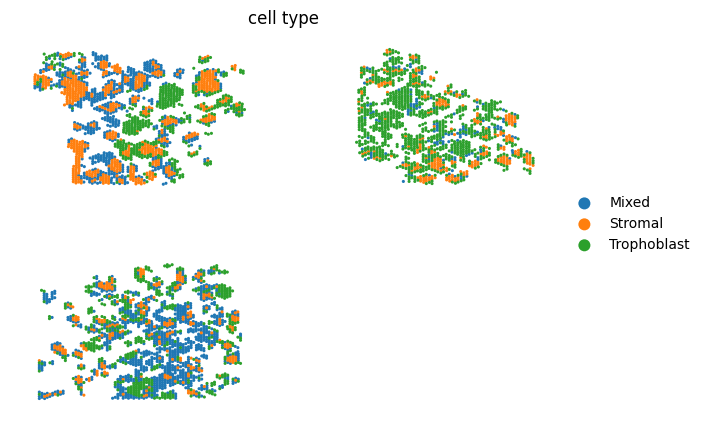

In [18]:
sc.pl.scatter(adata, basis="spatial_Merged", color="cell_type", size=20, frameon=False) #, save="first_tri_spatial_clusters.png") #groups=["32"],

In [19]:
adata.write_h5ad('spatial1_annotated.h5ad')

In [4]:
adata = sc.read_h5ad('spatial1_annotated.h5ad')

  0%|          | 0/1000 [00:00<?, ?/s]

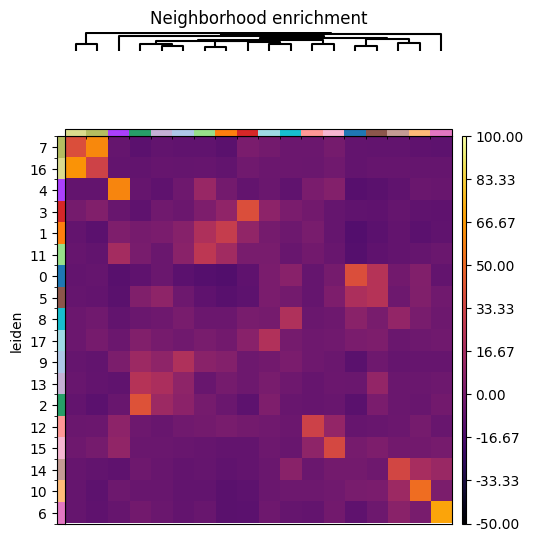

In [21]:
sq.gr.spatial_neighbors(adata, coord_type="generic", spatial_key="spatial")
sq.gr.nhood_enrichment(adata, cluster_key="leiden")
sq.pl.nhood_enrichment(
    adata,
    cluster_key="leiden",
    method="average",
    cmap="inferno",
    vmin=-50,
    vmax=100,
    figsize=(5, 5),
)

  0%|          | 0/1000 [00:00<?, ?/s]

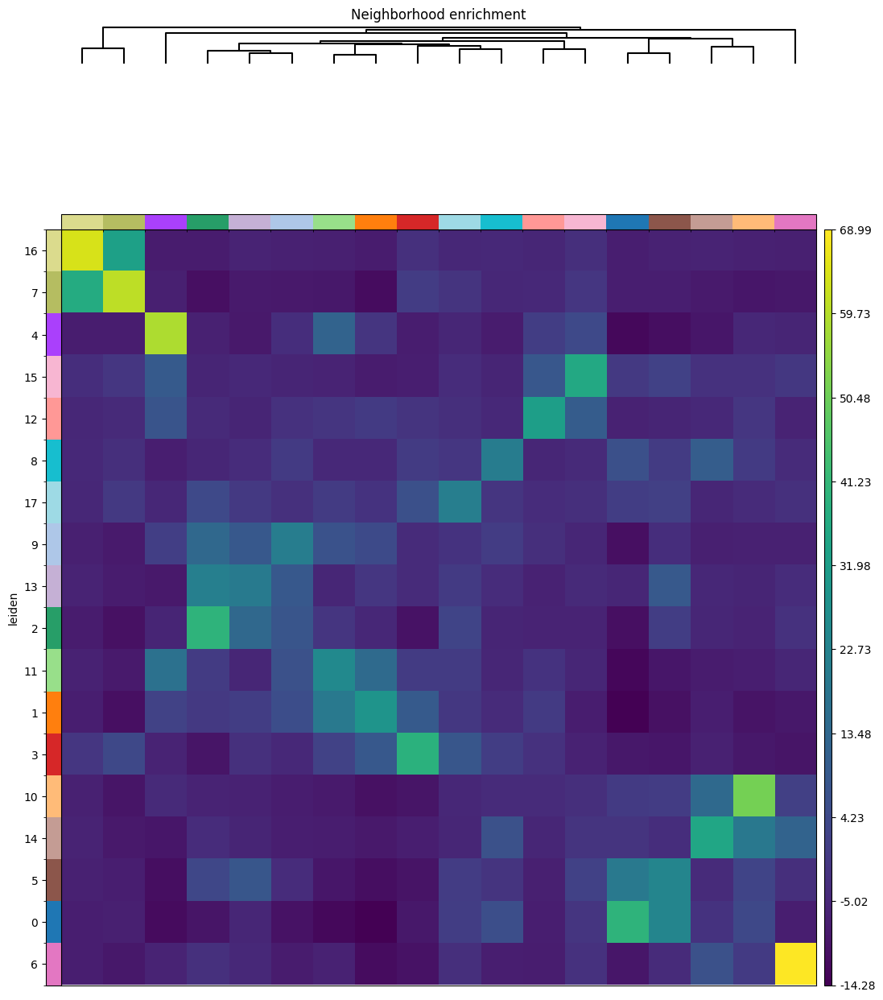

In [8]:
sq.gr.spatial_neighbors(adata, coord_type="generic", spatial_key="spatial")
sq.gr.nhood_enrichment(adata, cluster_key="leiden")
sq.pl.nhood_enrichment(
    adata,
    cluster_key="leiden",
    method="average",
   # vmin=-20,
    #vmax=100,
    #figsize=(5, 5),
)

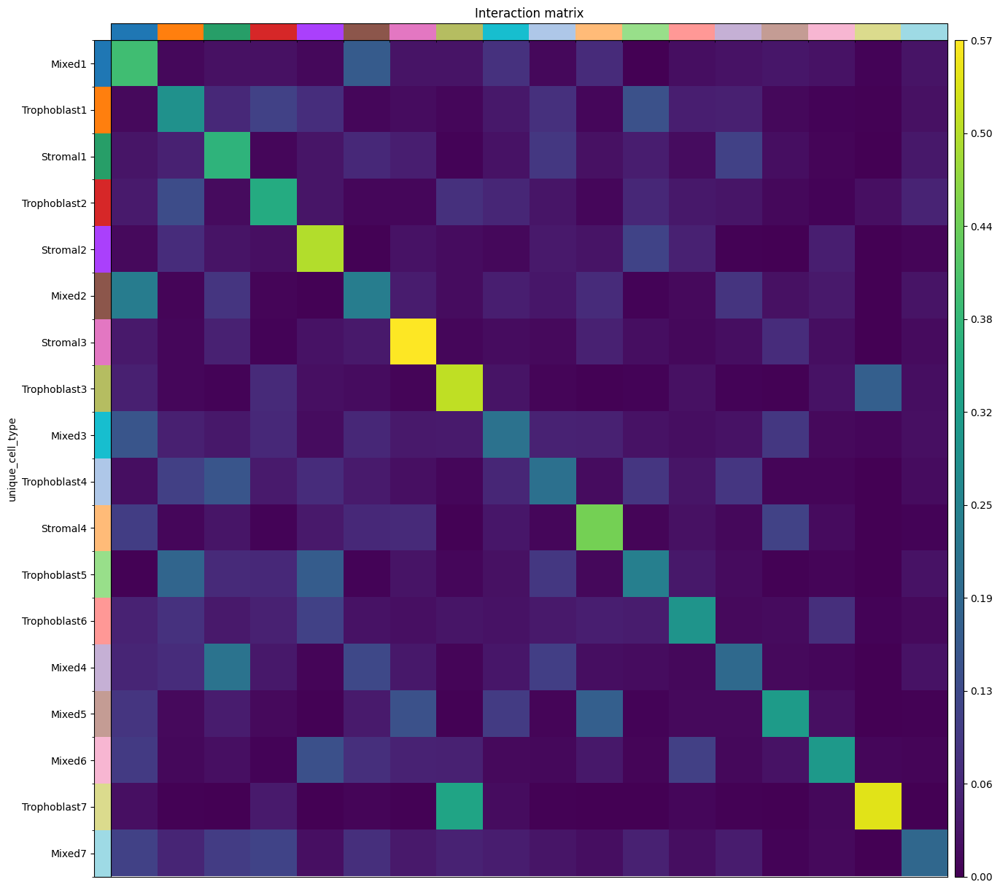

In [22]:
sq.gr.interaction_matrix(adata, cluster_key="unique_cell_type", normalized=True)
sq.pl.interaction_matrix(adata, cluster_key="unique_cell_type")

In [11]:
sq.gr.spatial_autocorr(adata, mode="moran")
num_view = 12
top_autocorr = (
    adata.uns["moranI"]["I"].sort_values(ascending=False).head(num_view).index.tolist()
)
bot_autocorr = (
    adata.uns["moranI"]["I"].sort_values(ascending=True).head(num_view).index.tolist()
)

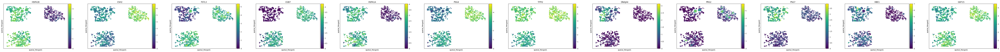

In [12]:
sc.pl.scatter(
    adata, basis="spatial_Merged",color=top_autocorr, size=20, 
)

In [14]:
## Network Centrality Scores
sq.gr.spatial_neighbors(adata)
sq.gr.centrality_scores(adata, "leiden")
sc.set_figure_params(figsize=(20, 8))

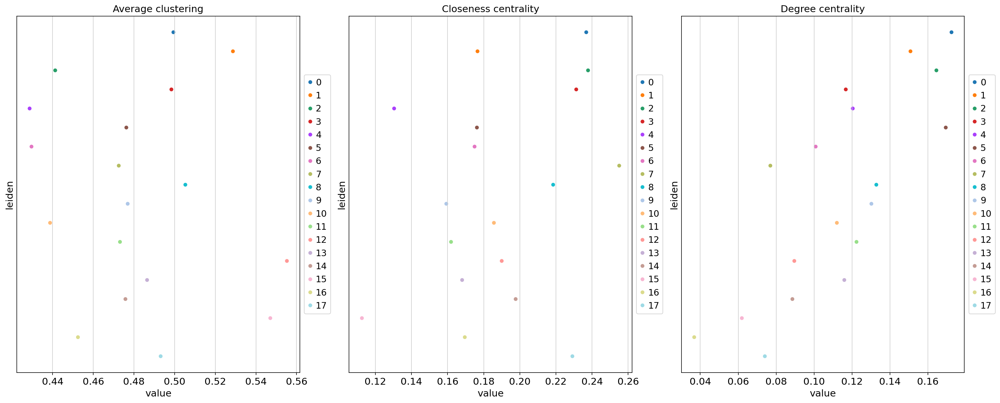

In [15]:
sq.pl.centrality_scores(adata, "leiden")
#- closeness centrality - measure of how close the group is to other nodes.
#- clustering coefficient - measure of the degree to which nodes cluster together.
#- degree centrality - fraction of non-group members connected to group members.

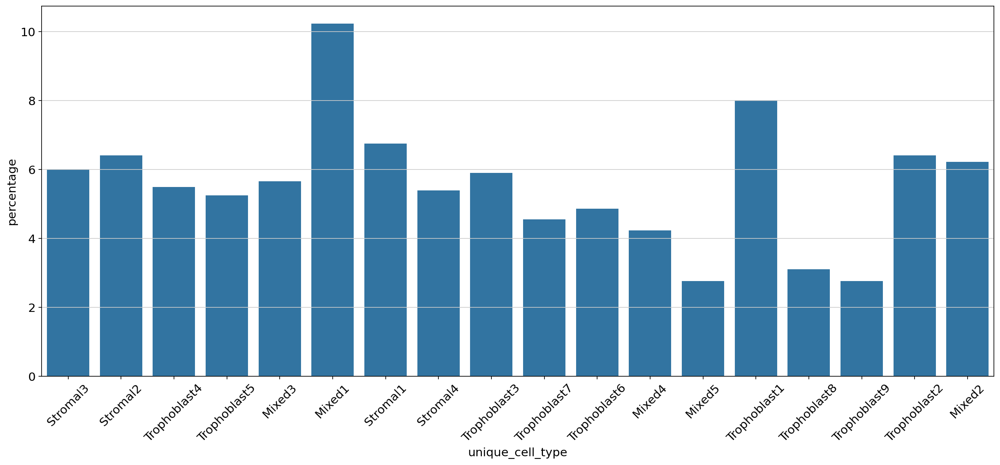

In [19]:
data={}
for v in adata.obs['unique_cell_type'].unique():
    data[v]=adata[adata.obs['unique_cell_type']==v].shape[0]/adata.shape[0]*100
df = pd.DataFrame.from_dict(data,orient='index',columns=['percentage'])    
df['unique_cell_type']=df.index
df=df.reset_index(drop=True)
sns.barplot(data=df, x='unique_cell_type', y='percentage')
plt.xticks(rotation=45)
plt.show()

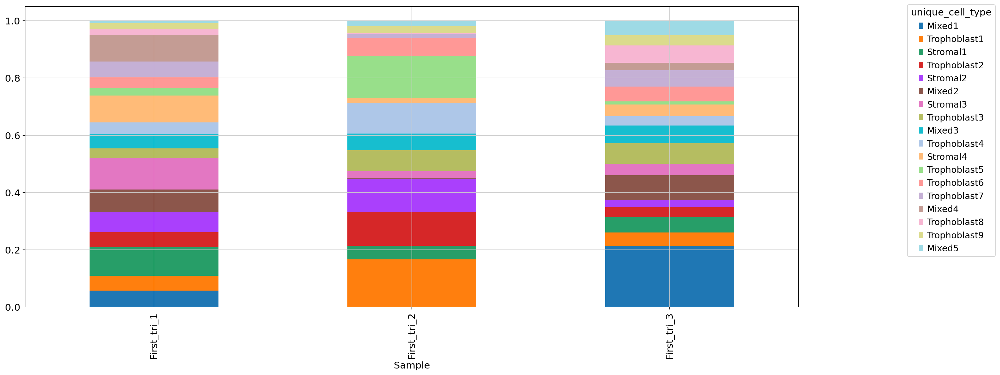

In [27]:
tmp = pd.crosstab(adata.obs['unique_cell_type'],adata.obs['Sample'], normalize='columns').T.plot(kind='bar', stacked=True)
tmp.legend(title='unique_cell_type', bbox_to_anchor=(1.26, 1.02),loc='upper right')

Text(0.5, 1.0, 'Stacked Bar Plot with Percentage Labels')

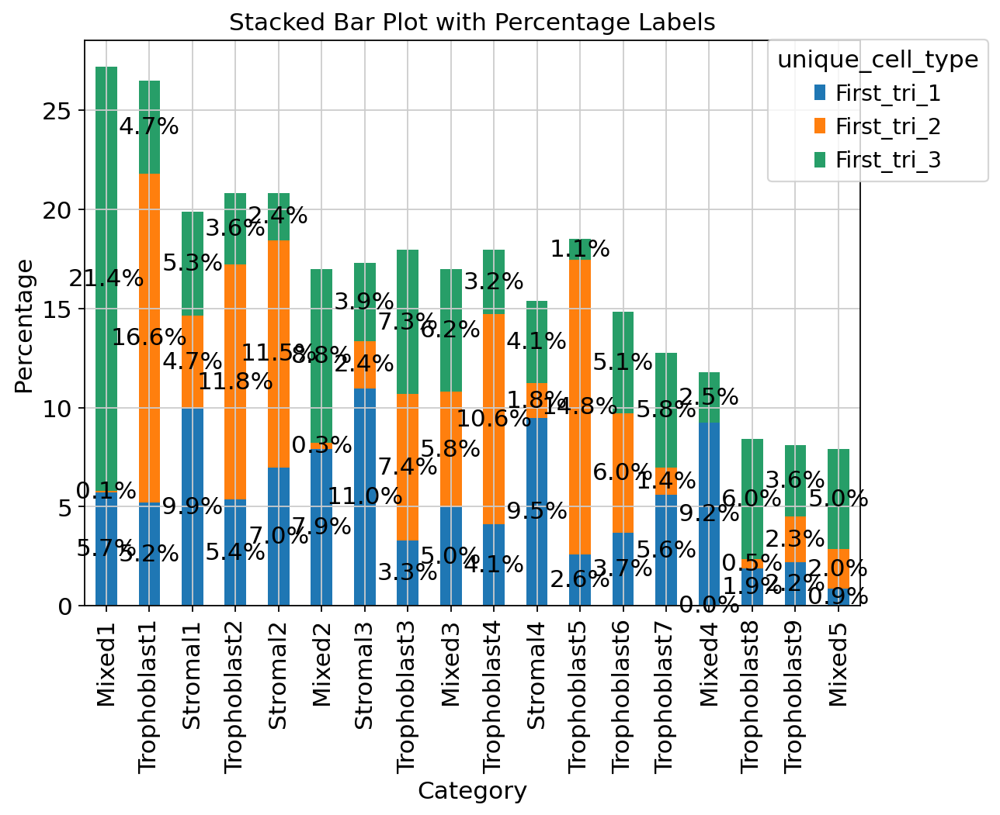

In [28]:
cross_tab = pd.crosstab(adata.obs['unique_cell_type'],adata.obs['Sample'], normalize='columns')*100 
axis=cross_tab.plot(kind='bar', stacked=True, figsize=(8, 6)) 
axis.legend(title="unique_cell_type", bbox_to_anchor=(1.18, 1.02), loc="upper right")
    # Add labels to the bars
for p in axis.patches:
        width, height = p.get_width(), p.get_height()
        x, y = p.get_xy() 
        axis.annotate(f'{height:.1f}%', (x + width/2, y + height/2), ha='center', va='center')
        # Set labels and title
plt.xlabel('Category')
plt.ylabel('Percentage')
plt.title('Stacked Bar Plot with Percentage Labels')

Text(0.5, 1.0, 'Stacked Bar Plot with Percentage Labels')

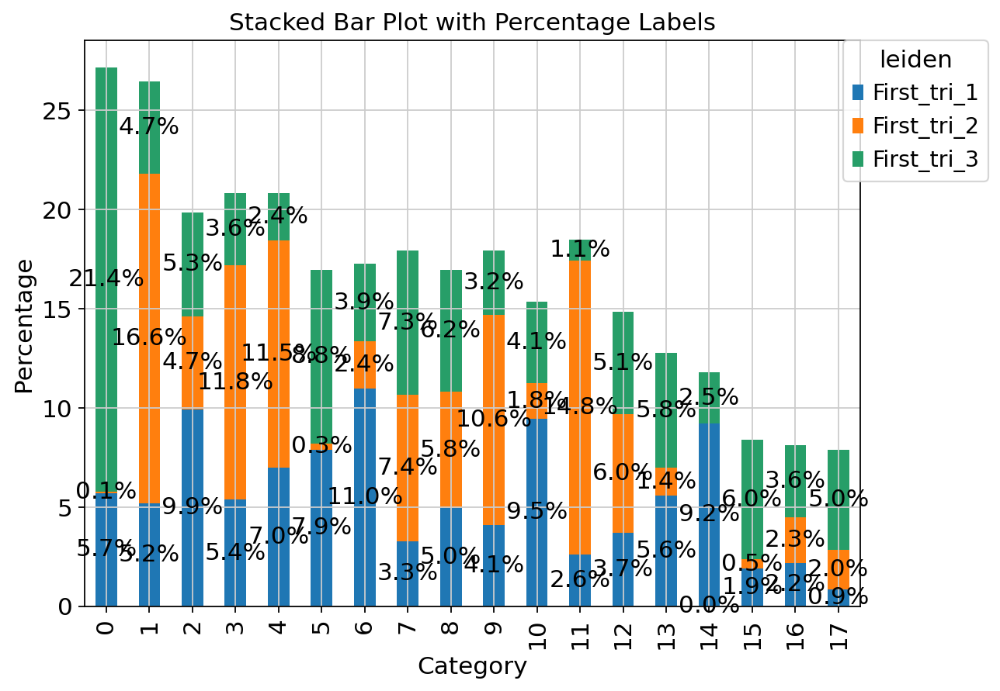

In [29]:
cross_tab = pd.crosstab(adata.obs['leiden'],adata.obs['Sample'], normalize='columns')*100 
axis=cross_tab.plot(kind='bar', stacked=True, figsize=(8, 6)) 
axis.legend(title="leiden", bbox_to_anchor=(1.18, 1.02), loc="upper right")
    # Add labels to the bars
for p in axis.patches:
        width, height = p.get_width(), p.get_height()
        x, y = p.get_xy() 
        axis.annotate(f'{height:.1f}%', (x + width/2, y + height/2), ha='center', va='center')
        # Set labels and title
plt.xlabel('Category')
plt.ylabel('Percentage')
plt.title('Stacked Bar Plot with Percentage Labels')

# OXPHOS heatmap #

In [23]:
mitocarta = pd.read_csv("./MitoCarta_full_transformed.csv")

In [24]:
# Create a dictionary where each gene maps to a list of pathways
gene_to_pathway_dict = mitocarta.groupby('Gene')['MitoPathway'].apply(list).to_dict()

# Add pathway information to the var metadata (now allows multiple pathways per gene)
adata.var['MitoPathways'] = adata.var_names.map(lambda x: gene_to_pathway_dict.get(x.split('.')[0], []))
# Check the result
adata.var[['MitoPathways']].head()

,MitoPathways
SAMD11,[]
NOC2L,[]
KLHL17,[]
PLEKHN1,[]
PERM1,[]


In [25]:
# 1. Define pathway names (matching the labels in MitoPathways)
pathway_names = ["OXPHOS", "OXPHOS_subunits", "OXPHOS_assembly_factors", "Complex_I", "CI_subunits", "CI_assembly_factors", 
                 "Complex_II", "CII_subunits", "CII_assembly_factors",
                 "Complex_III", "CIII_subunits", "CIII_assembly_factors",
                 "Complex_IV", "CIV_subunits", "CIV_assembly_factors",
                 "Complex_V", "CV_subunits", "CV_assembly_factors",
                 "Respirasome_assembly", "Cytochrome_C"]

In [26]:
# 2. Extract genes for each pathway
## create a dictionary where each key is a pathway name and each value is a list of genes associated with that pathway 
## finds genes in adata with the 'MitoPathways' annotation
pathway_genes = {}
for pathway in pathway_names:
    pathway_genes[pathway] = adata.var[adata.var['MitoPathways'].apply(lambda x: pathway in x)].index.tolist()
    print(f"Found {len(pathway_genes[pathway])} genes for {pathway}")

Found 136 genes for OXPHOS
Found 76 genes for OXPHOS_subunits
Found 61 genes for OXPHOS_assembly_factors
Found 53 genes for Complex_I
Found 32 genes for CI_subunits
Found 21 genes for CI_assembly_factors
Found 5 genes for Complex_II
Found 3 genes for CII_subunits
Found 2 genes for CII_assembly_factors
Found 13 genes for Complex_III
Found 7 genes for CIII_subunits
Found 6 genes for CIII_assembly_factors
Found 44 genes for Complex_IV
Found 17 genes for CIV_subunits
Found 27 genes for CIV_assembly_factors
Found 20 genes for Complex_V
Found 15 genes for CV_subunits
Found 5 genes for CV_assembly_factors
Found 2 genes for Respirasome_assembly
Found 2 genes for Cytochrome_C


In [27]:
# 3. Calculate the average expression per pathway per unique cell type
## extract list of unique_cell_types
unique_cell_types = adata.obs['cell_type'].cat.categories.tolist()
## create empty df where rows are pathways and columns are cell types to store average expression scores 
pathway_scores = pd.DataFrame(index=pathway_names, columns=unique_cell_types)

In [28]:
# loop through each pathway and its genes; prints warning if no genes found for a pathway
for pathway, genes in pathway_genes.items():
    if not genes:
        print(f"Warning: No genes found for pathway {pathway}")
        continue
        
    # create boolean mask for each cell type, then calculate mean expression of all pathway genes across the cells
    ## stored in pathway_scores df; converted to float
    for cell_type in unique_cell_types:
        cells_mask = adata.obs['cell_type'] == cell_type
        pathway_expr = adata[cells_mask, genes].X.mean(axis=0)
          # Convert to a numeric value explicitly
        pathway_scores.loc[pathway, cell_type] = float(np.mean(pathway_expr))

# Convert the DataFrame to numeric values
pathway_scores = pathway_scores.astype(float)

In [29]:
# 4. calculate Z-score 
## subtract pathway_scores by mean, and divide by standard deviation
## standardises data so each pathway has mean=0 and SD=1
means = pathway_scores.mean(axis=1)
stds = pathway_scores.std(axis=1)
pathway_scores_zscore = pathway_scores.subtract(means, axis=0).divide(stds, axis=0)

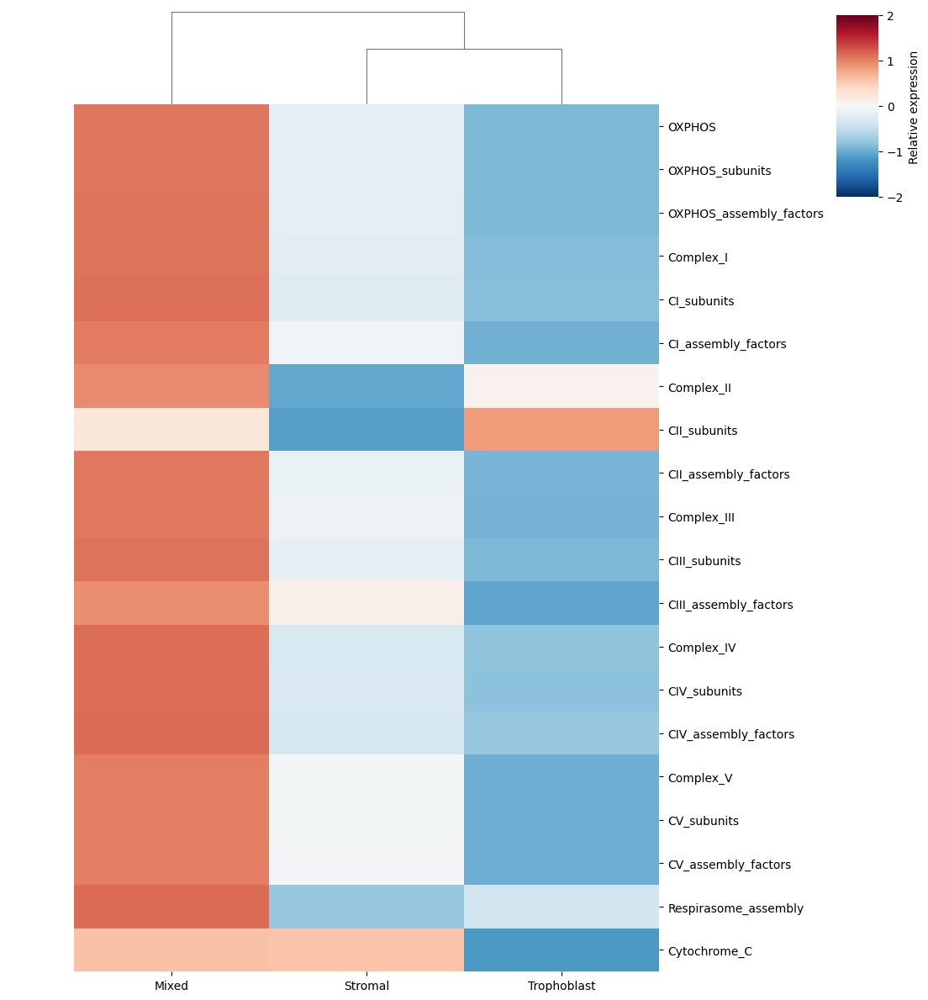

In [30]:
# Creating the heatmap with clustering only on cell types (columns)
ax = sns.clustermap(pathway_scores_zscore, 
                   cmap='RdBu_r',
                   center=0,
                   vmin=-2, vmax=2,
                   figsize=(10, 12),
                   cbar_kws={'label': 'Relative expression'},
                    cbar_pos=(1, .8, .05, .18),
                   dendrogram_ratio=0.1,
                   row_cluster=False,    # Don't cluster rows (pathways)
                   col_cluster=True)     # Cluster columns (cell types)


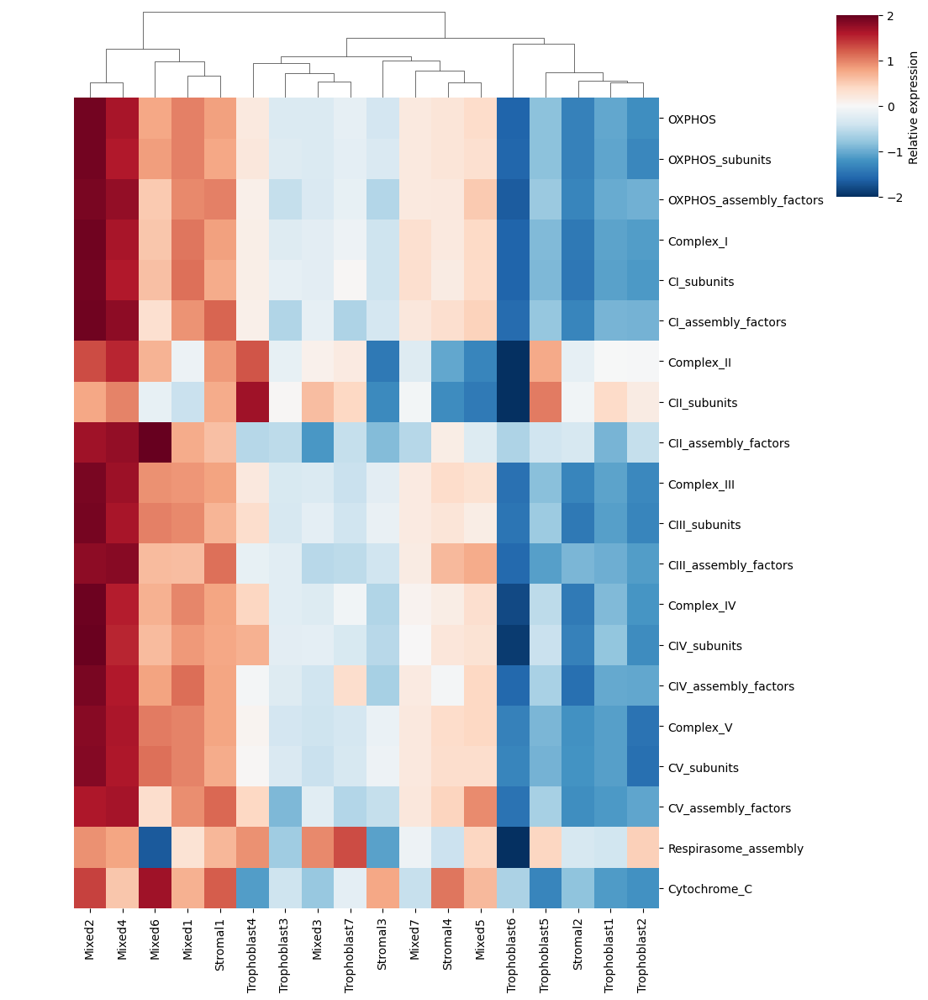

In [31]:
# 3. Calculate the average expression per pathway per unique cell type
## extract list of unique_cell_types
unique_cell_types = adata.obs['unique_cell_type'].cat.categories.tolist()
## create empty df where rows are pathways and columns are cell types to store average expression scores 
pathway_scores = pd.DataFrame(index=pathway_names, columns=unique_cell_types)

# loop through each pathway and its genes; prints warning if no genes found for a pathway
for pathway, genes in pathway_genes.items():
    if not genes:
        print(f"Warning: No genes found for pathway {pathway}")
        continue
        
    # create boolean mask for each cell type, then calculate mean expression of all pathway genes across the cells
    ## stored in pathway_scores df; converted to float
    for cell_type in unique_cell_types:
        cells_mask = adata.obs['unique_cell_type'] == cell_type
        pathway_expr = adata[cells_mask, genes].X.mean(axis=0)
          # Convert to a numeric value explicitly
        pathway_scores.loc[pathway, cell_type] = float(np.mean(pathway_expr))

# Convert the DataFrame to numeric values
pathway_scores = pathway_scores.astype(float)

# 4. calculate Z-score 
## subtract pathway_scores by mean, and divide by standard deviation
## standardises data so each pathway has mean=0 and SD=1
means = pathway_scores.mean(axis=1)
stds = pathway_scores.std(axis=1)
pathway_scores_zscore = pathway_scores.subtract(means, axis=0).divide(stds, axis=0)

# Creating the heatmap with clustering only on cell types (columns)
ax = sns.clustermap(pathway_scores_zscore, 
                   cmap='RdBu_r',
                   center=0,
                   vmin=-2, vmax=2,
                   figsize=(10, 12),
                   cbar_kws={'label': 'Relative expression'},
                    cbar_pos=(1, .8, .05, .18),
                   dendrogram_ratio=0.1,
                   row_cluster=False,    # Don't cluster rows (pathways)
                   col_cluster=True)     # Cluster columns (cell types)


In [42]:
adata.var_names[adata.var['MitoPathways'].map(lambda x: 'CII_subunits' in x)]

Index(['SDHB', 'SDHA', 'SDHD'], dtype='object')

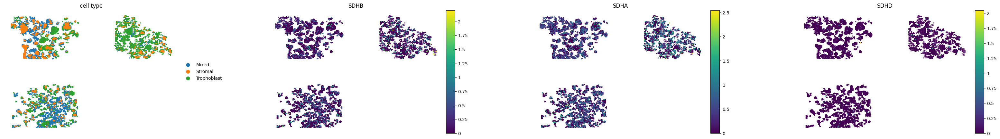

In [43]:
sc.pl.scatter(adata, basis="spatial_Merged", 
              color=["cell_type",'SDHB', 'SDHA', 'SDHD'], 
              frameon=False) #, save="first_tri_spatial_clusters.png") #groups=["32"],

In [34]:
adata.var_names[adata.var['MitoPathways'].map(lambda x: 'Cytochrome_C' in x)]

Index(['CYCS', 'HCCS'], dtype='object')

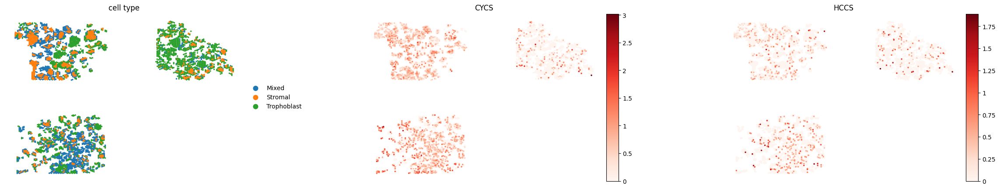

In [35]:
sc.pl.scatter(adata, basis="spatial_Merged", 
              color=["cell_type",'CYCS', 'HCCS'], 
              frameon=False, color_map="Reds") #, save="first_tri_spatial_clusters.png") #groups=["32"],

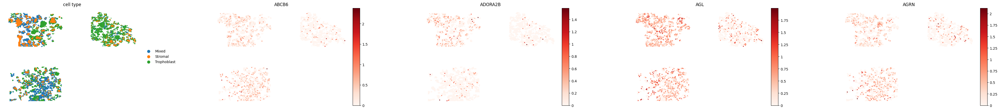

In [36]:
sc.pl.scatter(adata, basis="spatial_Merged", 
              color=["cell_type","ABCB6", "ADORA2B", "AGL", "AGRN"],
              frameon=False, color_map="Reds") #, save="first_tri_spatial_clusters.png") #groups=["32"],

In [37]:
glycolysis_genes = [
    "ABCB6", "ADORA2B", "AGL", "AGRN", "AK3", "AK4", "AKR1A1", "ALDH7A1", "ALDH9A1", 
    "ALDOA", "ALDOB", "ALG1", "ANG", "ANGPTL4", "ANKZF1", "ARPP19", "ARTN", "AURKA", 
    "B3GALT6", "B3GAT1", "B3GAT3", "B3GNT3", "B4GALT1", "B4GALT2", "B4GALT4", "B4GALT7", 
    "BIK", "BPNT1", "CACNA1H", "CAPN5", "CASP6", "CD44", "CDK1", "CENPA", "CHPF", "CHPF2", 
    "CHST1", "CHST12", "CHST2", "CHST4", "CHST6", "CITED2", "CLDN3", "CLDN9", "CLN6", 
    "COG2", "COL5A1", "COPB2", "CTH", "CXCR4", "CYB5A", "DCN", "DDIT4", "DEPDC1", "DLD", 
    "DPYSL4", "DSC2", "ECD", "EFNA3", "EGFR", "EGLN3", "ELF3", "ENO1", "ENO2", "ERO1A", 
    "EXT1", "EXT2", "FAM162A", "FBP2", "FKBP4", "FUT8", "G6PD", "GAL3ST1", "GALE", 
    "GALK1", "GALK2", "GAPDHS", "GCLC", "GFPT1", "GLCE", "GLRX", "GMPPA", "GMPPB", "GNE", 
    "GNPDA1", "GOT1", "GOT2", "GPC1", "GPC3", "GPC4", "GPR87", "GUSB", "GYS1", "GYS2", 
    "HAX1", "HDLBP", "HK2", "HMMR", "HOMER1", "HS2ST1", "HS6ST2", "HSPA5", "IDH1", "IDUA", 
    "IER3", "IGFBP3", "IL13RA1", "IRS2", "ISG20", "KDELR3", "KIF20A", "KIF2A", "LCT", 
    "LDHA", "LDHC", "LHPP", "LHX9", "MDH1", "MDH2", "ME1", "ME2", "MED24", "MERTK", 
    "MET", "MIF", "MIOX", "MPI", "MXI1", "NANP", "NASP", "NDST3", "NDUFV3", "NOL3", 
    "NSDHL", "NT5E", "P4HA1", "P4HA2", "PAM", "PAXIP1", "PC", "PDK3", "PFKFB1", "PFKP", 
    "PGAM1", "PGAM2", "PGK1", "PGLS", "PGM2", "PHKA2", "PKM", "PKP2", "PLOD1", "PLOD2", 
    "PMM2", "POLR3K", "PPFIA4", "PPIA", "PPP2CB", "PRPS1", "PSMC4", "PYGB", "PYGL", 
    "QSOX1", "RARS1", "RBCK1", "RPE", "RRAGD", "SAP30", "SDC1", "SDC2", "SDC3", "SDHC", 
    "SLC16A3", "SLC25A10", "SLC25A13", "SLC35A3", "SLC37A4", "SOD1", "SOX9", "SPAG4", 
    "SRD5A3", "STC1", "STC2", "STMN1", "TALDO1", "TFF3", "TGFA", "TGFBI", "TKTL1", 
    "TPBG", "TPI1", "TPST1", "GFUS", "TXN", "UGP2", "VCAN", "VEGFA", "VLDLR", "XYLT2", 
    "ZNF292"
]

# Wrap as a pathway
pathway_genes = {"Glycolysis": glycolysis_genes}

In [38]:
# 2️⃣ --- Cell types present in your data ---
cell_types = adata.obs['cell_type'].unique().tolist()

# 3️⃣ --- Initialize the DataFrame to store mean expression per gene × cell_type ---
gene_scores = pd.DataFrame(index=glycolysis_genes, columns=cell_types)

# 4️⃣ --- Fill the DataFrame with mean expression values ---
for cell_type in cell_types:
    mask = adata.obs['cell_type'] == cell_type
    for g in glycolysis_genes:
        if g not in adata.var_names:
            continue
        expr = adata[mask, g].X
        gene_scores.loc[g, cell_type] = float(np.mean(expr))

# 5️⃣ --- Clean and z-score the data per gene (row) ---
gene_scores = gene_scores.astype(float)
gene_scores.dropna(how='all', inplace=True)

# Z-score across columns (i.e., cell types) per gene
gene_z = gene_scores.subtract(gene_scores.mean(axis=1), axis=0)\
                    .divide(gene_scores.std(axis=1), axis=0)

# # 6️⃣ --- Color map for cell types (optional, adjust based on your dataset) ---
# cell_type_colors = {
#     'Mixed':       '#3585BB',
#     'Trophoblast': '#42A942',
#     'Stromal':     '#FF851B'
#     # Add or update keys to match your actual cell_type values
# }
# col_colors = pd.Series(cell_types, index=cell_types).map(cell_type_colors)

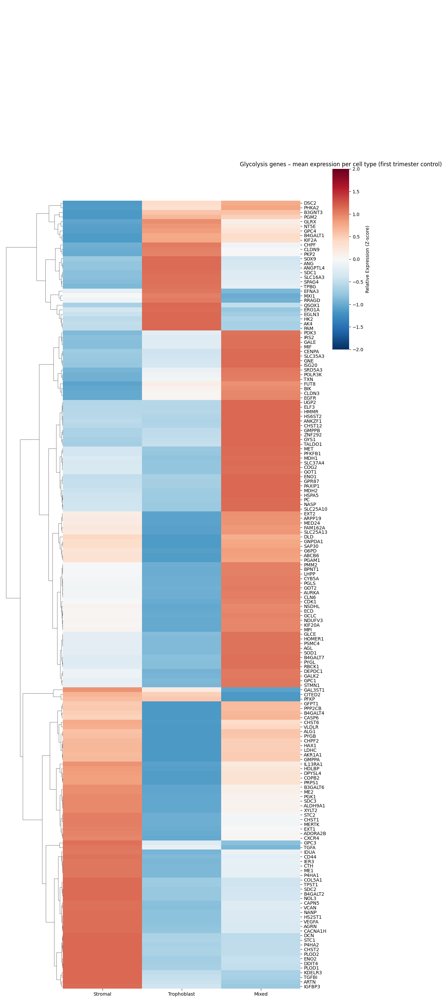

In [39]:
# 7️⃣ --- Plot the heatmap ---
sns.clustermap(gene_z,
               cmap='RdBu_r',
               center=0, vmin=-2, vmax=2,
               figsize=(10, 30),
               yticklabels=True,
               cbar_kws={'label': 'Relative Expression (Z-score)'},
               cbar_pos=(1, .65, .05, .18),
               row_cluster=True,
               col_cluster=False)

plt.title('Glycolysis genes – mean expression per cell type (first trimester control)')
plt.show()

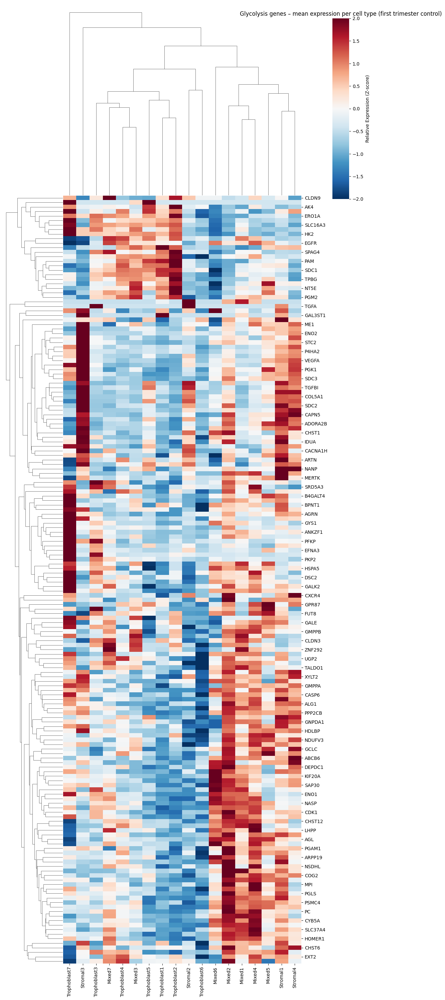

In [44]:
# 2️⃣ --- Cell types present in your data ---
cell_types = adata.obs['unique_cell_type'].unique().tolist()

# 3️⃣ --- Initialize the DataFrame to store mean expression per gene × cell_type ---
gene_scores = pd.DataFrame(index=glycolysis_genes, columns=cell_types)

# 4️⃣ --- Fill the DataFrame with mean expression values ---
for cell_type in cell_types:
    mask = adata.obs['unique_cell_type'] == cell_type
    for g in glycolysis_genes:
        if g not in adata.var_names:
            continue
        expr = adata[mask, g].X
        gene_scores.loc[g, cell_type] = float(np.mean(expr))

# 5️⃣ --- Clean and z-score the data per gene (row) ---
gene_scores = gene_scores.astype(float)
gene_scores.dropna(how='all', inplace=True)

# Z-score across columns (i.e., cell types) per gene
gene_z = gene_scores.subtract(gene_scores.mean(axis=1), axis=0)\
                    .divide(gene_scores.std(axis=1), axis=0)

# # 6️⃣ --- Color map for cell types (optional, adjust based on your dataset) ---
# cell_type_colors = {
#     'Mixed':       '#3585BB',
#     'Trophoblast': '#42A942',
#     'Stromal':     '#FF851B'
#     # Add or update keys to match your actual cell_type values
# }
# col_colors = pd.Series(cell_types, index=cell_types).map(cell_type_colors)

# 7️⃣ --- Plot the heatmap ---
sns.clustermap(gene_z,
               cmap='RdBu_r',
               center=0, vmin=-2, vmax=2,
               figsize=(10, 15),
               #yticklabels=True,
               cbar_kws={'label': 'Relative Expression (Z-score)'},
               cbar_pos=(1, .8, .05, .18),
               row_cluster=True,
               col_cluster=True,
               #col_colors=col_colors
              )

plt.title('Glycolysis genes – mean expression per cell type (first trimester control)')
plt.show()


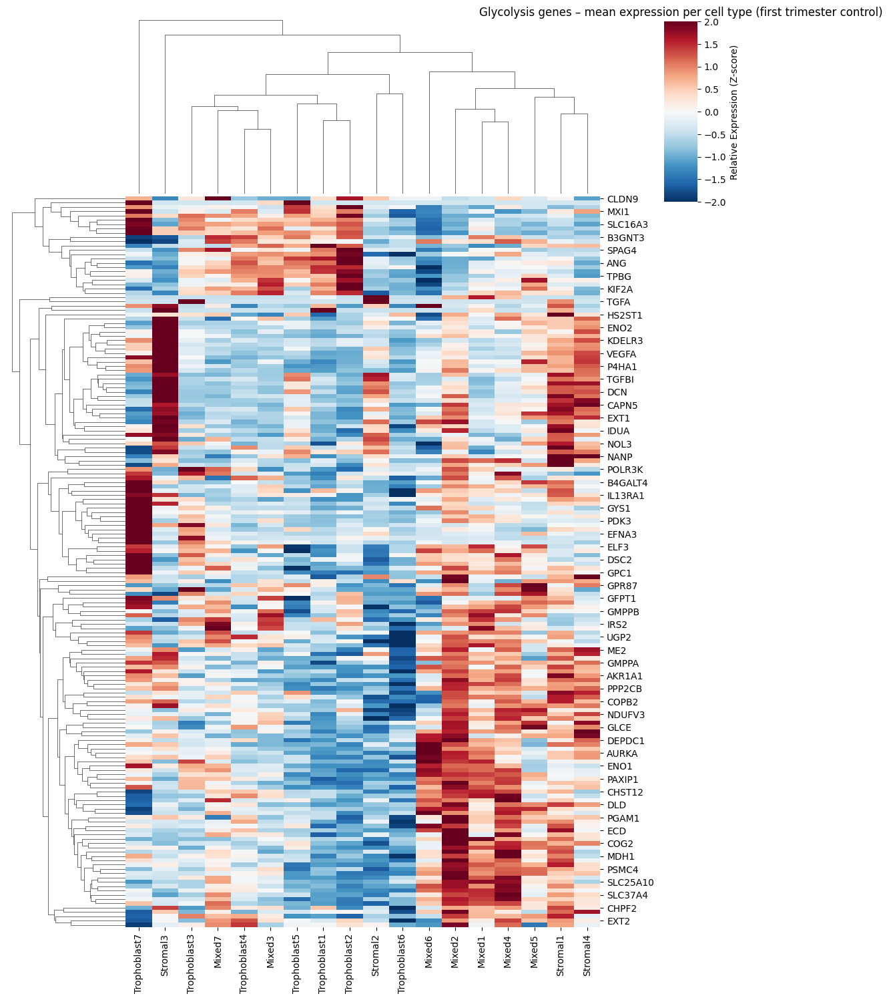

In [45]:
# 7️⃣ --- Plot the heatmap ---
sns.clustermap(gene_z,
               cmap='RdBu_r',
               center=0, vmin=-2, vmax=2,
               figsize=(10, 15),
               #yticklabels=True,
               cbar_kws={'label': 'Relative Expression (Z-score)'},
               cbar_pos=(1, .8, .05, .18),
               row_cluster=True,
               col_cluster=True,
               #col_colors=col_colors
              )

plt.title('Glycolysis genes – mean expression per cell type (first trimester control)')
plt.show()

# OXPHOS heatmap #

# OXPHOS heatmap #

# OXPHOS heatmap #

# OXPHOS heatmap #

In [30]:
mitocarta = pd.read_csv("./MitoCarta_full_transformed.csv")

In [31]:
# Create a dictionary where each gene maps to a list of pathways
gene_to_pathway_dict = mitocarta.groupby('Gene')['MitoPathway'].apply(list).to_dict()

# Add pathway information to the var metadata (now allows multiple pathways per gene)
adata.var['MitoPathways'] = adata.var_names.map(lambda x: gene_to_pathway_dict.get(x.split('.')[0], []))
# Check the result
adata.var[['MitoPathways']].head()

,MitoPathways
SAMD11,[]
NOC2L,[]
KLHL17,[]
PLEKHN1,[]
PERM1,[]


In [32]:
# 1. Define pathway names (matching the labels in MitoPathways)
pathway_names = ["OXPHOS", "OXPHOS_subunits", "OXPHOS_assembly_factors", "Complex_I", "CI_subunits", "CI_assembly_factors", 
                 "Complex_II", "CII_subunits", "CII_assembly_factors",
                 "Complex_III", "CIII_subunits", "CIII_assembly_factors",
                 "Complex_IV", "CIV_subunits", "CIV_assembly_factors",
                 "Complex_V", "CV_subunits", "CV_assembly_factors",
                 "Respirasome_assembly", "Cytochrome_C"]

In [33]:
# 2. Extract genes for each pathway
## create a dictionary where each key is a pathway name and each value is a list of genes associated with that pathway 
## finds genes in adata with the 'MitoPathways' annotation
pathway_genes = {}
for pathway in pathway_names:
    pathway_genes[pathway] = adata.var[adata.var['MitoPathways'].apply(lambda x: pathway in x)].index.tolist()
    print(f"Found {len(pathway_genes[pathway])} genes for {pathway}")

Found 136 genes for OXPHOS
Found 76 genes for OXPHOS_subunits
Found 61 genes for OXPHOS_assembly_factors
Found 53 genes for Complex_I
Found 32 genes for CI_subunits
Found 21 genes for CI_assembly_factors
Found 5 genes for Complex_II
Found 3 genes for CII_subunits
Found 2 genes for CII_assembly_factors
Found 13 genes for Complex_III
Found 7 genes for CIII_subunits
Found 6 genes for CIII_assembly_factors
Found 44 genes for Complex_IV
Found 17 genes for CIV_subunits
Found 27 genes for CIV_assembly_factors
Found 20 genes for Complex_V
Found 15 genes for CV_subunits
Found 5 genes for CV_assembly_factors
Found 2 genes for Respirasome_assembly
Found 2 genes for Cytochrome_C


In [41]:
# 3. Calculate the average expression per pathway per unique cell type
## extract list of unique_cell_types
unique_cell_types = adata.obs['cell_type'].cat.categories.tolist()
## create empty df where rows are pathways and columns are cell types to store average expression scores 
pathway_scores = pd.DataFrame(index=pathway_names, columns=unique_cell_types)

In [42]:
# loop through each pathway and its genes; prints warning if no genes found for a pathway
for pathway, genes in pathway_genes.items():
    if not genes:
        print(f"Warning: No genes found for pathway {pathway}")
        continue
        
    # create boolean mask for each cell type, then calculate mean expression of all pathway genes across the cells
    ## stored in pathway_scores df; converted to float
    for cell_type in unique_cell_types:
        cells_mask = adata.obs['cell_type'] == cell_type
        pathway_expr = adata[cells_mask, genes].X.mean(axis=0)
          # Convert to a numeric value explicitly
        pathway_scores.loc[pathway, cell_type] = float(np.mean(pathway_expr))

# Convert the DataFrame to numeric values
pathway_scores = pathway_scores.astype(float)

In [43]:
# 4. calculate Z-score 
## subtract pathway_scores by mean, and divide by standard deviation
## standardises data so each pathway has mean=0 and SD=1
means = pathway_scores.mean(axis=1)
stds = pathway_scores.std(axis=1)
pathway_scores_zscore = pathway_scores.subtract(means, axis=0).divide(stds, axis=0)

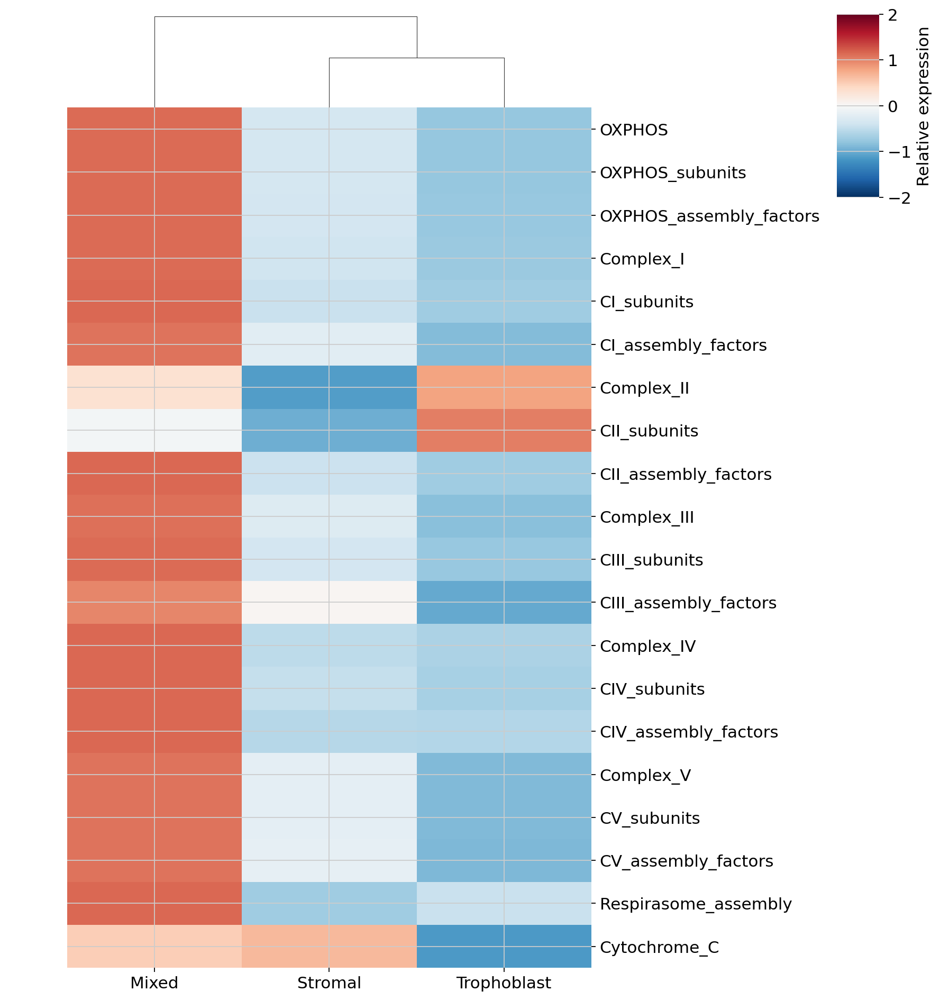

In [44]:
# Creating the heatmap with clustering only on cell types (columns)
ax = sns.clustermap(pathway_scores_zscore, 
                   cmap='RdBu_r',
                   center=0,
                   vmin=-2, vmax=2,
                   figsize=(10, 12),
                   cbar_kws={'label': 'Relative expression'},
                    cbar_pos=(1, .8, .05, .18),
                   dendrogram_ratio=0.1,
                   row_cluster=False,    # Don't cluster rows (pathways)
                   col_cluster=True)     # Cluster columns (cell types)


In [47]:
# 3. Calculate the average expression per pathway per unique cell type
## extract list of unique_cell_types
unique_cell_types = adata.obs['unique_cell_type'].cat.categories.tolist()
## create empty df where rows are pathways and columns are cell types to store average expression scores 
pathway_scores = pd.DataFrame(index=pathway_names, columns=unique_cell_types)

# loop through each pathway and its genes; prints warning if no genes found for a pathway
for pathway, genes in pathway_genes.items():
    if not genes:
        print(f"Warning: No genes found for pathway {pathway}")
        continue
        
    # create boolean mask for each cell type, then calculate mean expression of all pathway genes across the cells
    ## stored in pathway_scores df; converted to float
    for cell_type in unique_cell_types:
        cells_mask = adata.obs['unique_cell_type'] == cell_type
        #pathway_expr = adata[cells_mask, genes].X.mean(axis=0)
        pathway_expr = np.median(adata[cells_mask, genes].X.A if hasattr(adata.X, 'A') else adata[cells_mask, genes].X, axis=0)
          # Convert to a numeric value explicitly
        #pathway_scores.loc[pathway, cell_type] = float(np.mean(pathway_expr))
        pathway_scores.loc[pathway, cell_type] = float(np.median(pathway_expr))


# Convert the DataFrame to numeric values
pathway_scores = pathway_scores.astype(float)

# 4. calculate Z-score 
## subtract pathway_scores by mean, and divide by standard deviation
## standardises data so each pathway has mean=0 and SD=1
means = pathway_scores.mean(axis=1)
stds = pathway_scores.std(axis=1)
pathway_scores_zscore = pathway_scores.subtract(means, axis=0).divide(stds, axis=0)

# Creating the heatmap with clustering only on cell types (columns)
ax = sns.clustermap(pathway_scores_zscore, 
                   cmap='RdBu_r',
                   center=0,
                   vmin=-2, vmax=2,
                   figsize=(10, 12),
                   cbar_kws={'label': 'Relative expression'},
                    cbar_pos=(1, .8, .05, .18),
                   dendrogram_ratio=0.1,
                   row_cluster=False,    # Don't cluster rows (pathways)
                   col_cluster=True)     # Cluster columns (cell types)


AxisError: axis 0 is out of bounds for array of dimension 0

In [41]:
adata

AnnData object with n_obs × n_vars = 4917 × 14912
    obs: 'in_tissue', 'array_row', 'array_col', 'Trimester', 'Sample', 'Gestation', 'Code', 'Batch', 'n_genes_by_counts', 'total_counts', 'n_genes', 'leiden', 'cell_type', 'unique_cell_type'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches', 'MitoPathways'
    uns: 'Sample_colors', 'spatial', 'hvg', 'log1p', 'pca', 'neighbors', 'umap', 'Gestation_colors', 'leiden', 'leiden_colors', 'cell_type_colors', 'spatial_neighbors', 'leiden_nhood_enrichment', 'unique_cell_type_interactions'
    obsm: 'X_spatial_First_tri_1', 'X_spatial_First_tri_2', 'X_spatial_First_tri_3', 'X_spatial_Merged', 'spatial', 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities', 'spatial_connectivities', 'spatial_distances'